# OpenCV Image Processing Tutorial

This notebook covers fundamental concepts and techniques in image processing using OpenCV and Python.

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

## 1. Image Basics

### 1.1 Image Representation
Images in OpenCV are represented as multi-dimensional NumPy arrays. Each pixel is represented by intensity values in different channels.

In [14]:
# Load an image
img = cv2.imread('data/Parrot.webp')

# Display image properties
print(f"Image shape: {img.shape}")
print(f"Image data type: {img.dtype}")
print(f"Number of channels: {img.shape[2]}")

Image shape: (525, 700, 3)
Image data type: uint8
Number of channels: 3


### 1.2 Loading, Displaying, and Saving Images

In [15]:
# Display the image
cv2.imshow('Image', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Save the image
cv2.imwrite('data/saved_image.jpg', img)

True

### 1.3 Color Spaces

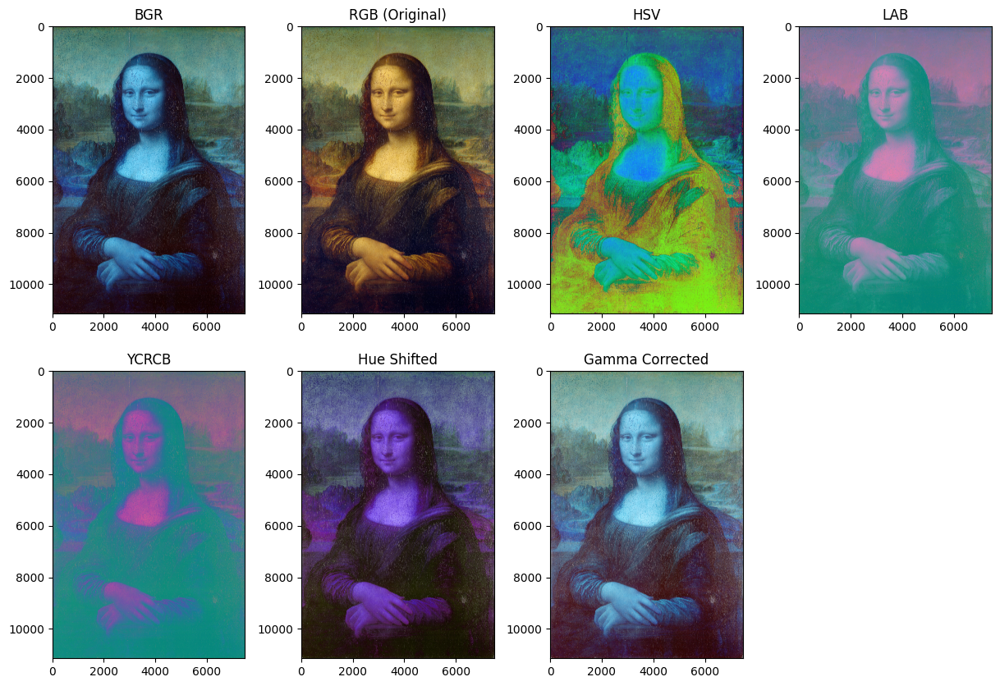

In [16]:
# Load an image
img = cv2.imread('data/Mona_Lisa.jpg')

# I added cv2.cvtColor(img, cv2.COLOR_BGR2RGB) to convert images from BGR to RGB. This is necessary because OpenCV reads images in BGR format, while Matplotlib expects RGB. 
# For color images, converting with cv2.cvtColor ensures correct color representation in Matplotlib.
# For grayscale images, using cmap='gray' ensures proper display in shades of gray. 

# Convert BGR to RGB
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert BGR to HSV
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Convert BGR to LAB
lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Convert BGR to YCRCB
ycrcb_img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)


# Color Transformations
def adjust_hue(img, value):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hsv[:,:,0] = (hsv[:,:,0] + value) % 180
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

# Adjust hue
hue_shifted_img = adjust_hue(img, 30)

# Gamma Correction
def gamma_correction(img, gamma):
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

# Apply gamma correction
gamma_corrected_img = gamma_correction(img, 1.5)


# Display results
plt.figure(figsize=(15, 10))

plt.subplot(241), plt.imshow(img), plt.title('BGR')
plt.subplot(242), plt.imshow(rgb_img), plt.title('RGB (Original)')
plt.subplot(243), plt.imshow(hsv_img), plt.title('HSV')
plt.subplot(244), plt.imshow(lab_img), plt.title('LAB')
plt.subplot(245), plt.imshow(ycrcb_img), plt.title('YCRCB')
plt.subplot(246), plt.imshow(hue_shifted_img), plt.title('Hue Shifted')
plt.subplot(247), plt.imshow(gamma_corrected_img), plt.title('Gamma Corrected')
plt.show()

### 1.4 Basic Operations

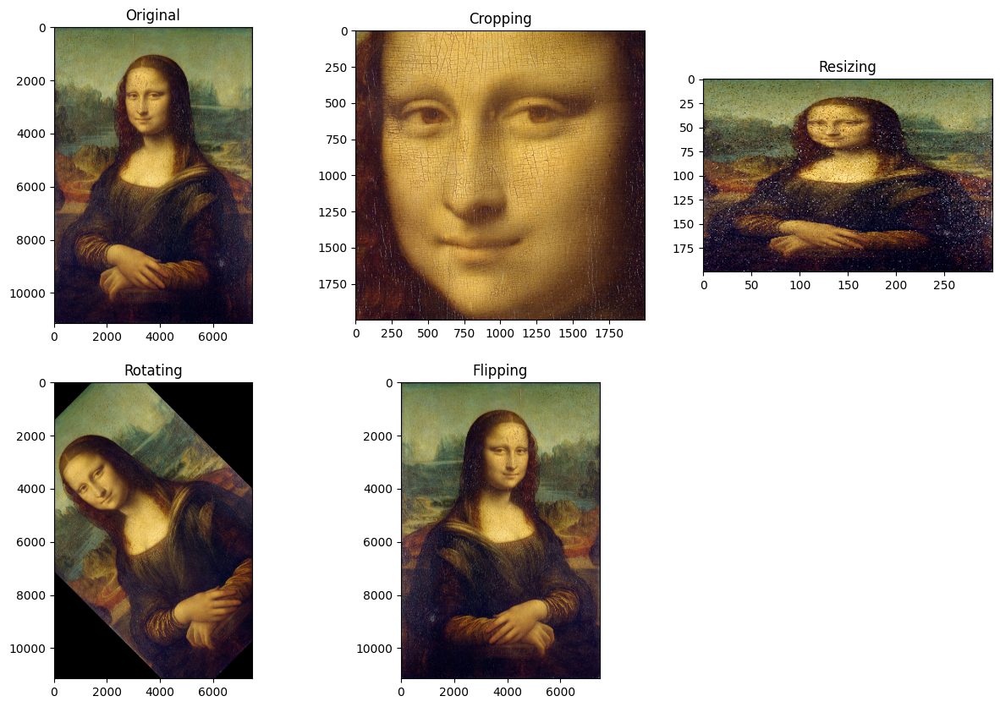

In [17]:
# Load an image
img = cv2.imread('data/Mona_Lisa.jpg')

# Cropping
cropped = img[2000:4000, 2500:4500]

# Resizing
resized = cv2.resize(img, (300, 200))

# Rotating
rows, cols = img.shape[:2]
M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)
rotated = cv2.warpAffine(img, M, (cols, rows))

# Flipping
flipped = cv2.flip(img, 1)  # 1 for horizontal flip, 0 for vertical, -1 for both

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)), plt.title('Cropping')
plt.subplot(233), plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)), plt.title('Resizing')
plt.subplot(234), plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)), plt.title('Rotating')
plt.subplot(235), plt.imshow(cv2.cvtColor(flipped, cv2.COLOR_BGR2RGB)), plt.title('Flipping')
plt.show()

### 1.5 Accessing and Modifying Pixel Values

In [18]:
# Access a pixel value
px = img[100, 100]
print(f"Pixel value at (100, 100): {px}")

# Modify a pixel value
img[100, 100] = [255, 0, 0]  # Set to blue in BGR

Pixel value at (100, 100): [113 138 110]


### 1.6 Drawing Functions

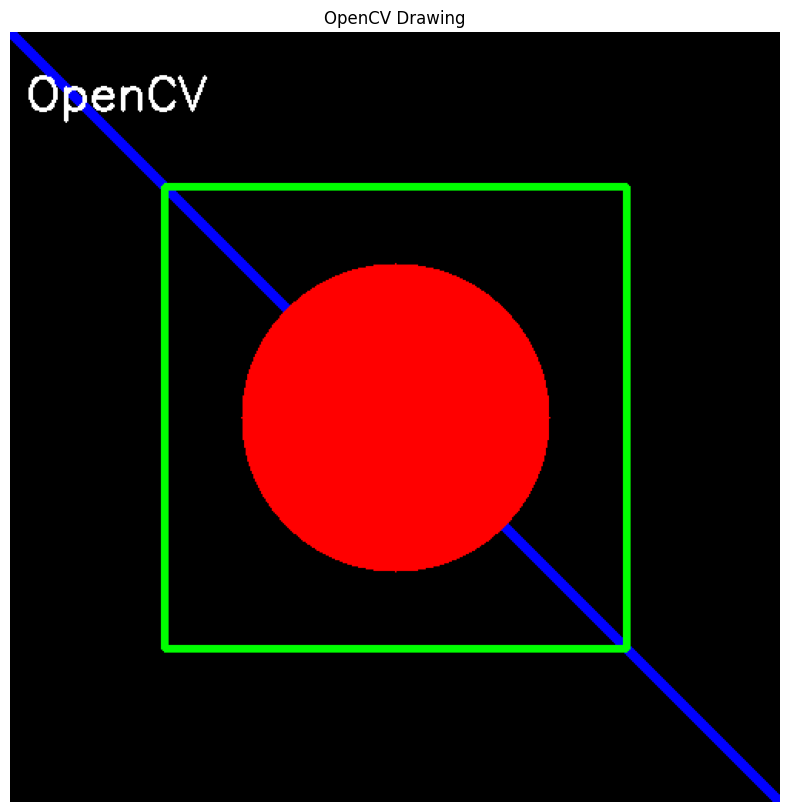

In [19]:
# Create a blank image
blank = np.zeros((500, 500, 3), dtype=np.uint8)

# Draw a line
cv2.line(blank, (0, 0), (500, 500), (255, 0, 0), 5)

# Draw a rectangle
cv2.rectangle(blank, (100, 100), (400, 400), (0, 255, 0), 3)

# Draw a circle
cv2.circle(blank, (250, 250), 100, (0, 0, 255), -1)

# Add text
cv2.putText(blank, 'OpenCV', (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

# Convert BGR to RGB
rgb_blank = cv2.cvtColor(blank, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10))
plt.imshow(rgb_blank)
plt.axis('off')
plt.title('OpenCV Drawing')
plt.show()

### 1.7 Sampling and Quantization

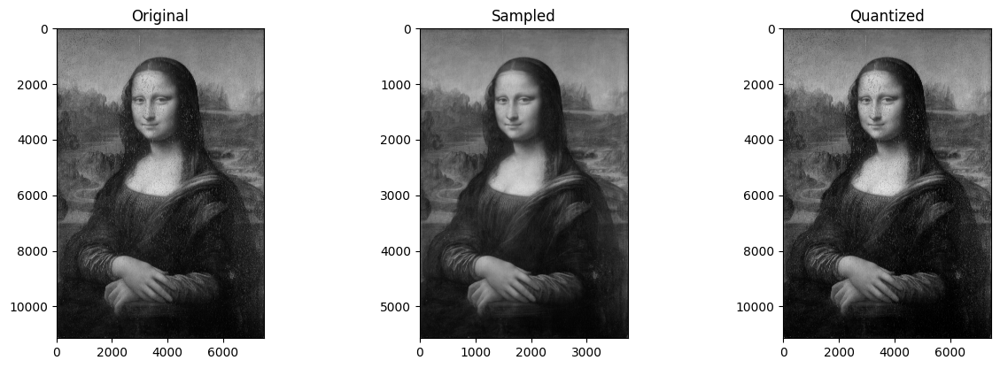

In [20]:
# Load the image
img = cv2.imread('data/Mona_Lisa.jpg', cv2.IMREAD_GRAYSCALE)

# Demonstrate sampling by resizing
sampled_img = cv2.resize(img, (img.shape[1]//2, img.shape[0]//2))

# Demonstrate quantization by reducing bit depth
quantized_img = np.uint8(img / 16) * 16

# Display results
plt.figure(figsize=(15, 10))

plt.subplot(231), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(232), plt.imshow(sampled_img, cmap='gray'), plt.title('Sampled')
plt.subplot(233), plt.imshow(quantized_img, cmap='gray'), plt.title('Quantized')
plt.show()

### 1.8 Pixel Representation and Image Resolution

Image shape: (11146, 7479)
Image data type: uint8
Bit depth: 8 bits


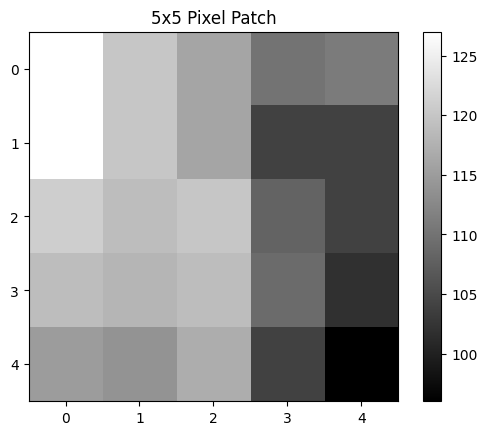

In [21]:
# Display image information
print(f"Image shape: {img.shape}")
print(f"Image data type: {img.dtype}")
print(f"Bit depth: {img.dtype.itemsize * 8} bits")

# Display a small patch of pixels
plt.imshow(img[100:105, 100:105], cmap='gray', interpolation='nearest')
plt.title('5x5 Pixel Patch')
plt.colorbar()
plt.show()

### 1.9 CCD and CMOS Sensors

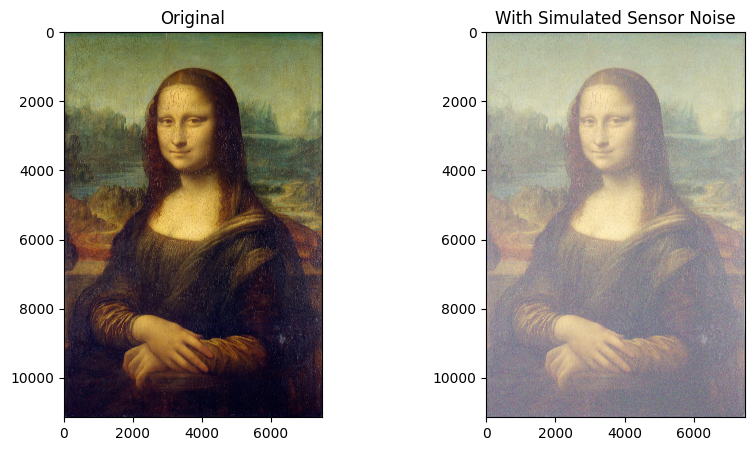

In [22]:
# Load a color image
img = cv2.imread('data/Mona_Lisa.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def add_sensor_noise(img, std_dev):
    noise = np.random.normal(0, std_dev, img.shape).astype(np.uint8)
    return cv2.add(img, noise)

# Simulate sensor noise
img_noisy = add_sensor_noise(img_color, 10)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img_color), plt.title('Original')
plt.subplot(122), plt.imshow(img_noisy), plt.title('With Simulated Sensor Noise')
plt.show()

### 1.10 Bayer Pattern and Demosaicing

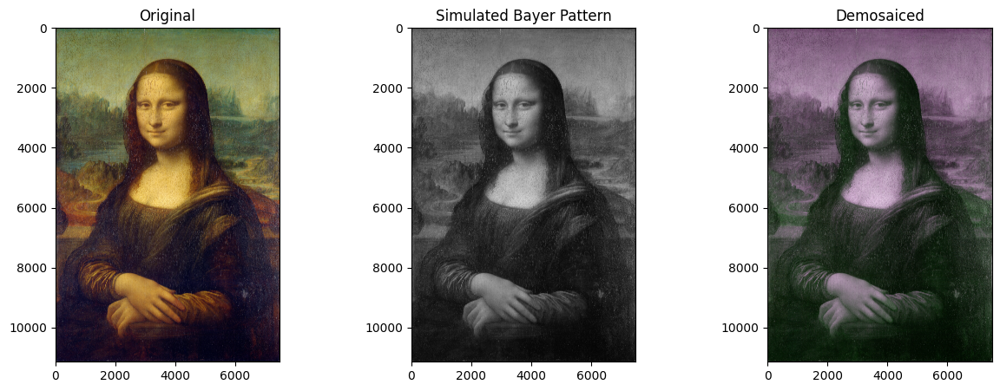

In [23]:
def simulate_bayer(img):
    bayer = np.zeros(img.shape[:2], dtype=np.uint8)
    bayer[0::2, 0::2] = img[0::2, 0::2, 1]  # Green
    bayer[1::2, 0::2] = img[1::2, 0::2, 2]  # Blue
    bayer[0::2, 1::2] = img[0::2, 1::2, 0]  # Red
    bayer[1::2, 1::2] = img[1::2, 1::2, 1]  # Green
    return bayer

# Simulate Bayer pattern
bayer_img = simulate_bayer(img_color)

# Demosaic
demosaiced = cv2.cvtColor(bayer_img, cv2.COLOR_BayerBG2RGB)

plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(img_color), plt.title('Original')
plt.subplot(132), plt.imshow(bayer_img, cmap='gray'), plt.title('Simulated Bayer Pattern')
plt.subplot(133), plt.imshow(demosaiced), plt.title('Demosaiced')
plt.show()

### 1.11 Lens Distortions and Aberrations

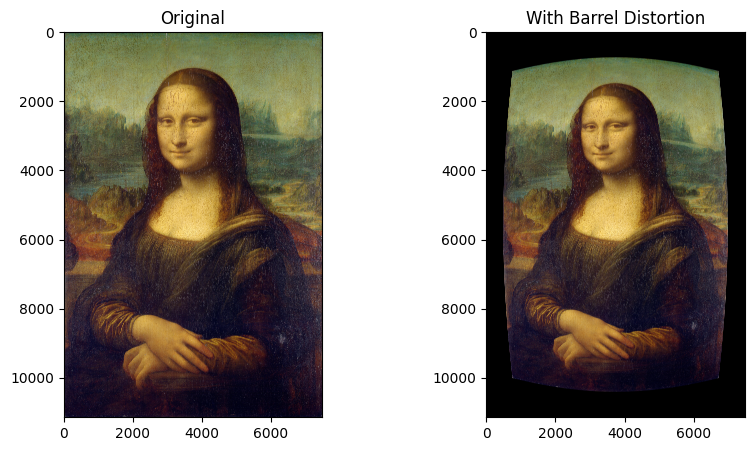

In [24]:
def barrel_distortion(img, k):
    rows, cols = img.shape[:2]
    map_x, map_y = np.meshgrid(np.arange(cols), np.arange(rows))
    
    # Normalize coordinates
    x = (map_x - cols/2) / (cols/2)
    y = (map_y - rows/2) / (rows/2)
    
    # Apply barrel distortion
    r = np.sqrt(x**2 + y**2)
    x_distorted = x * (1 + k * r**2)
    y_distorted = y * (1 + k * r**2)
    
    # Unnormalize coordinates
    map_x = (x_distorted * cols/2 + cols/2).astype(np.float32)
    map_y = (y_distorted * rows/2 + rows/2).astype(np.float32)
    
    return cv2.remap(img, map_x, map_y, cv2.INTER_LINEAR)

# Apply barrel distortion
distorted_img = barrel_distortion(img_color, 0.2)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(img_color), plt.title('Original')
plt.subplot(122), plt.imshow(distorted_img), plt.title('With Barrel Distortion')
plt.show()

## 2. Image Processing

### 2.1 Filtering

### 2.1.1 Spatial Domain Filters

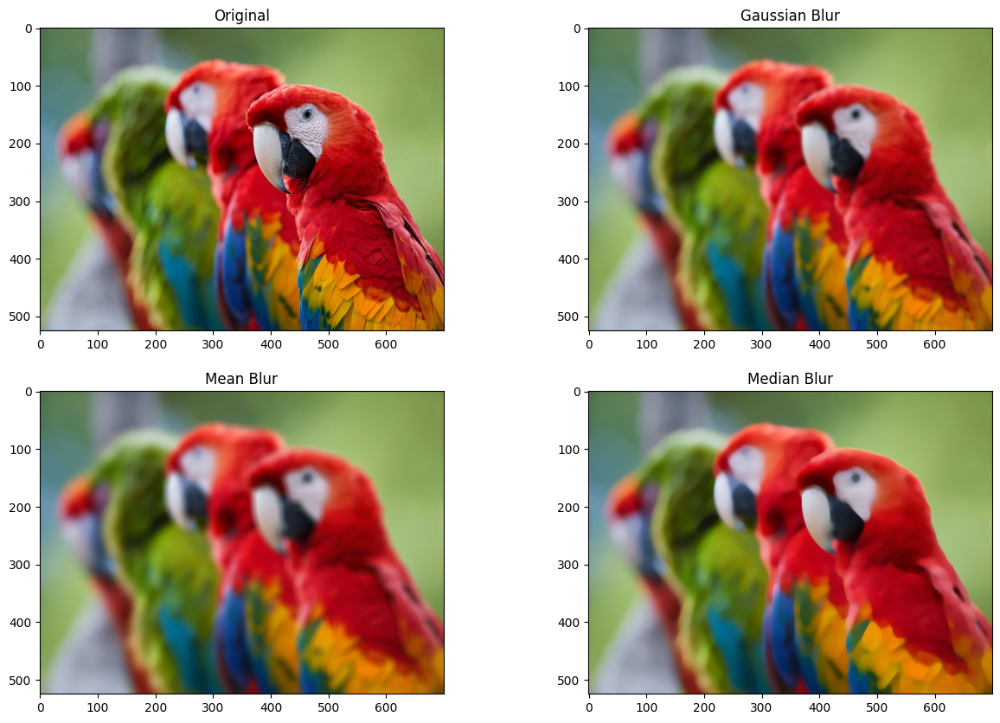

In [25]:
# Load an image
img = cv2.imread('data/Parrot.webp')

# Gaussian Blur
gaussian = cv2.GaussianBlur(img, (15, 15), 0)

# Mean Blur
mean = cv2.blur(img, (15, 15))

# Median Blur
median = cv2.medianBlur(img, 15)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(222), plt.imshow(cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)), plt.title('Gaussian Blur')
plt.subplot(223), plt.imshow(cv2.cvtColor(mean, cv2.COLOR_BGR2RGB)), plt.title('Mean Blur')
plt.subplot(224), plt.imshow(cv2.cvtColor(median, cv2.COLOR_BGR2RGB)), plt.title('Median Blur')
plt.show()

### 2.1.2 Non-linear Filters

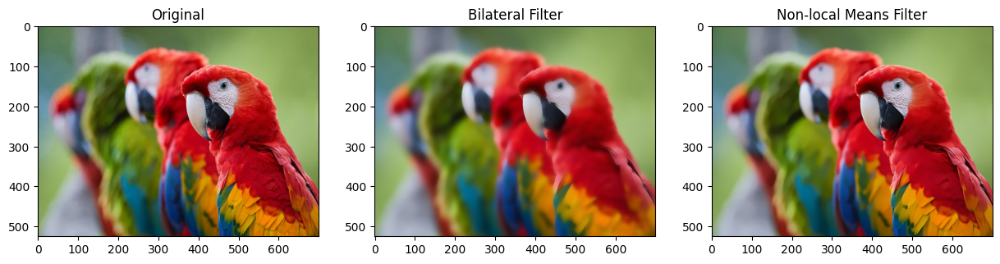

In [26]:
# Bilateral Filter
bilateral = cv2.bilateralFilter(img, 19, 175, 175)

# Non-local Means filter
nlm = cv2.fastNlMeansDenoising(img, None, 10, 7, 21)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(cv2.cvtColor(bilateral, cv2.COLOR_BGR2RGB)), plt.title('Bilateral Filter')
plt.subplot(233), plt.imshow(cv2.cvtColor(nlm, cv2.COLOR_BGR2RGB)), plt.title('Non-local Means Filter')

plt.show()

### 2.1.3 Frequency Domain Filters

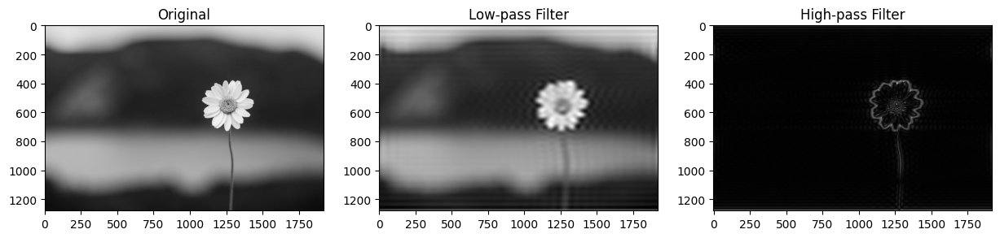

In [27]:
# Load an image
img = cv2.imread('data/daisy.jpg')

# Fast Fourier Transform (FFT)
def fft_filter(image, filter_func): # grey images
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    filtered = filter_func(fshift)
    f_ishift = np.fft.ifftshift(filtered)
    img_back = np.fft.ifft2(f_ishift)
    return np.abs(img_back)

def low_pass_filter(fshift):
    rows, cols = fshift.shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1
    return fshift * mask

def high_pass_filter(fshift):
    rows, cols = fshift.shape
    crow, ccol = rows//2, cols//2
    mask = np.ones((rows, cols), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 0
    return fshift * mask
    
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Apply filters
low_pass = fft_filter(gray, low_pass_filter)
high_pass = fft_filter(gray, high_pass_filter)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(gray, cmap='gray'), plt.title('Original')
plt.subplot(232), plt.imshow(low_pass, cmap='gray'), plt.title('Low-pass Filter')
plt.subplot(233), plt.imshow(high_pass, cmap='gray'), plt.title('High-pass Filter')
plt.show()

### 2.2 Edge Detection

#### 2.2.1 Gradient-based Methods

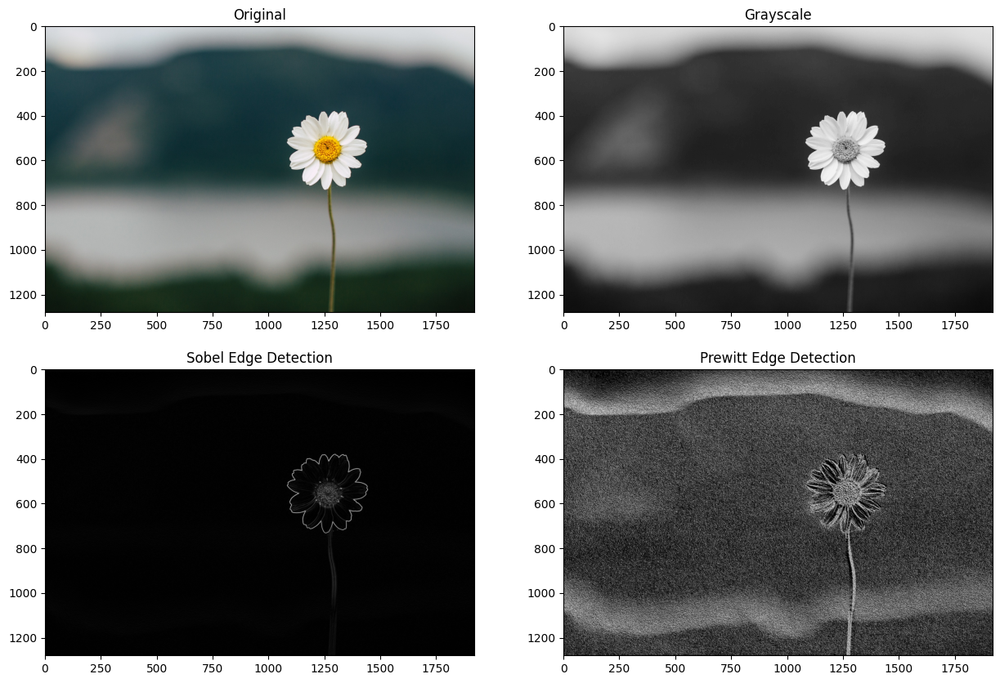

In [28]:
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Sobel Edge Detection
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)
sobel = cv2.magnitude(sobelx, sobely)

# Prewitt Edge Detection
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewittx = cv2.filter2D(gray, -1, kernelx)
prewitty = cv2.filter2D(gray, -1, kernely)
prewitt = np.sqrt(prewittx**2 + prewitty**2)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(222), plt.imshow(gray, cmap='gray'), plt.title('Grayscale')
plt.subplot(223), plt.imshow(np.abs(sobel), cmap='gray'), plt.title('Sobel Edge Detection')
plt.subplot(224), plt.imshow(np.abs(prewitt), cmap='gray'), plt.title('Prewitt Edge Detection')
plt.show()

#### 2.2.2 Laplacian-based Methods

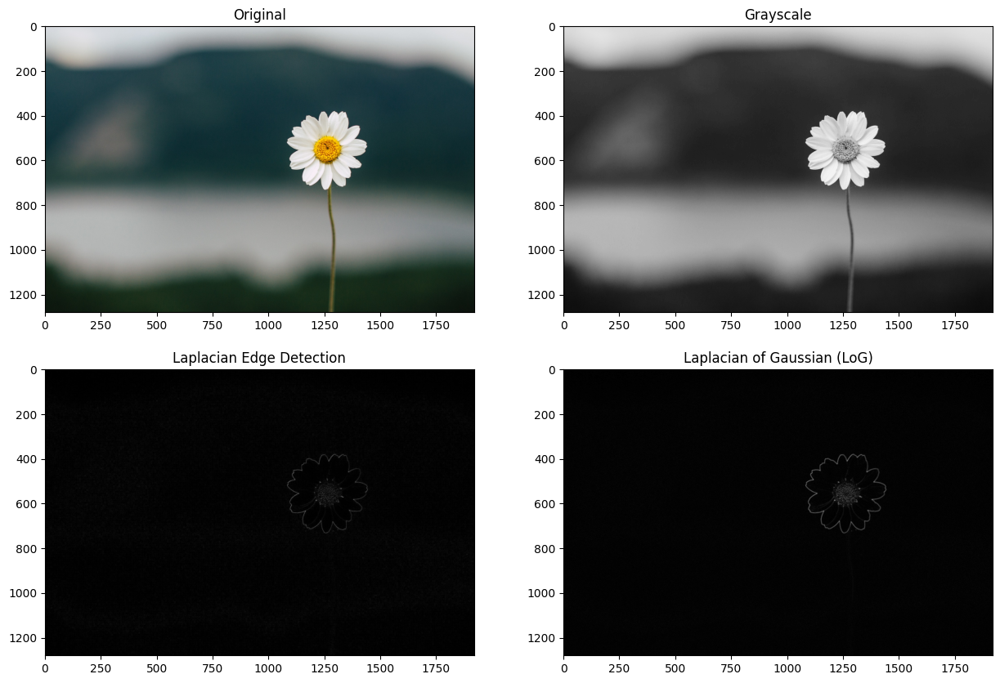

In [29]:
# Laplacian Edge Detection
laplacian = cv2.Laplacian(gray, cv2.CV_64F)

# Laplacian of Gaussian (LoG)
blur = cv2.GaussianBlur(gray, (3,3), 0)
log = cv2.Laplacian(blur, cv2.CV_64F)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(222), plt.imshow(gray, cmap='gray'), plt.title('Grayscale')
plt.subplot(223), plt.imshow(np.abs(laplacian), cmap='gray'), plt.title('Laplacian Edge Detection')
plt.subplot(224), plt.imshow(np.abs(log), cmap='gray'), plt.title('Laplacian of Gaussian (LoG)')
plt.show()

#### 2.2.3 Canny Edge Detector

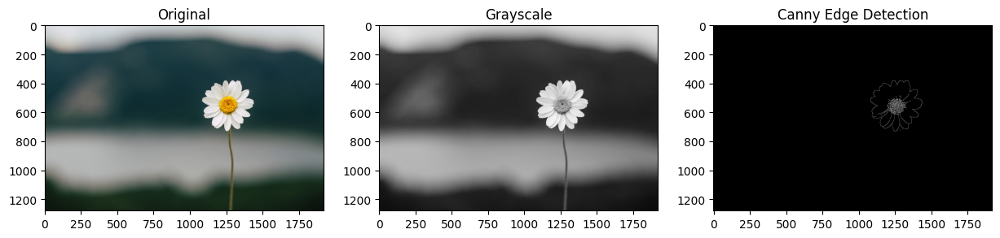

In [30]:
# Canny Edge Detection
canny = cv2.Canny(gray, 100, 200)


# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(gray, cmap='gray'), plt.title('Grayscale')
plt.subplot(233), plt.imshow(canny, cmap='gray'), plt.title('Canny Edge Detection')
plt.show()

### 2.3 Thresholding

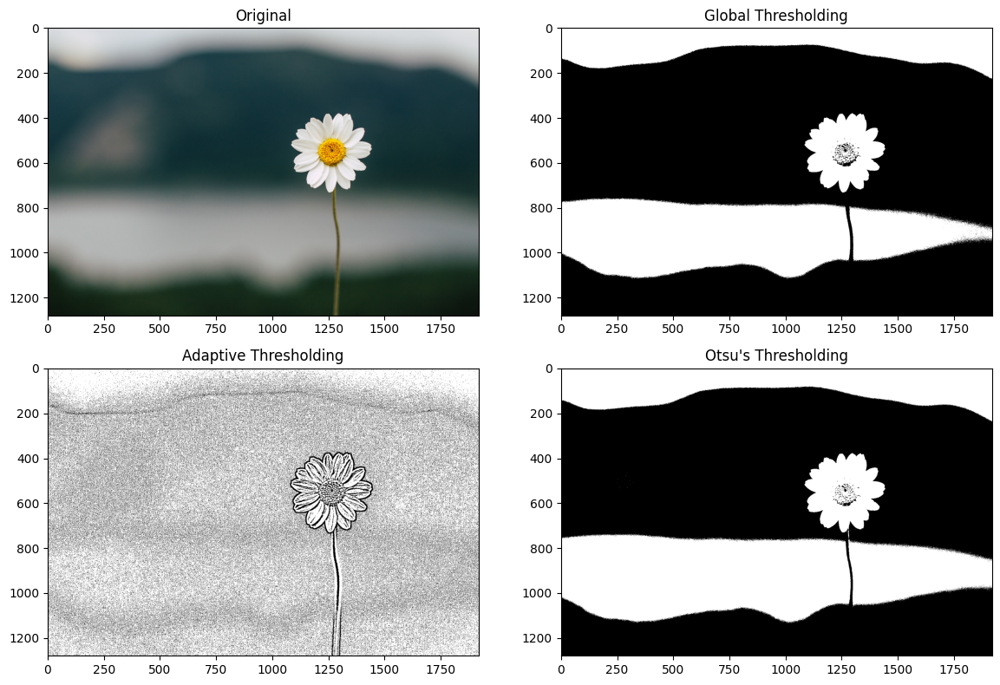

In [31]:
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Global Thresholding
ret, thresh1 = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

# Adaptive Thresholding
thresh2 = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# Otsu's Thresholding
ret, thresh3 = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Display results
plt.figure(figsize=(12, 8))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(222), plt.imshow(thresh1, cmap='gray'), plt.title('Global Thresholding')
plt.subplot(223), plt.imshow(thresh2, cmap='gray'), plt.title('Adaptive Thresholding')
plt.subplot(224), plt.imshow(thresh3, cmap='gray'), plt.title("Otsu's Thresholding")

plt.tight_layout()
plt.show()

### 2.4 Morphological Operations

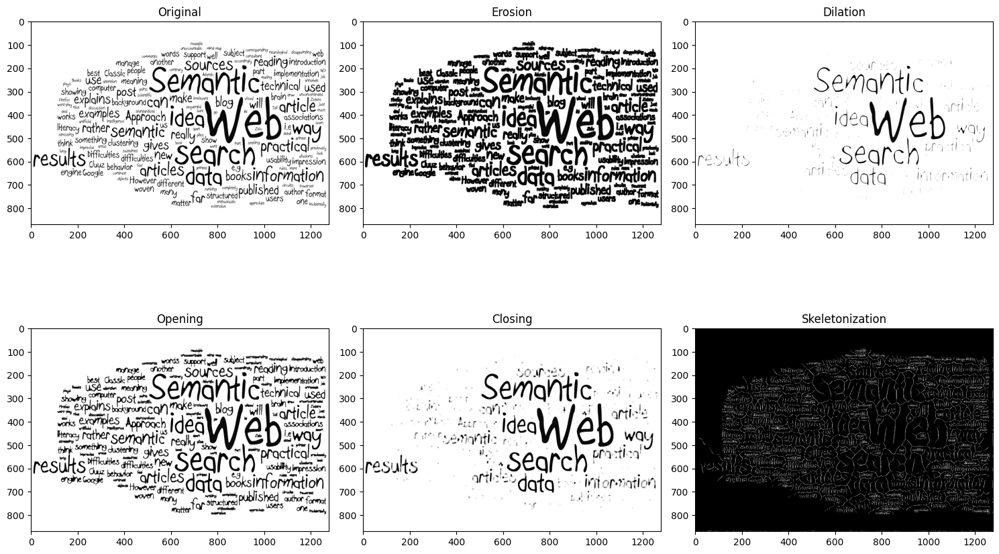

In [32]:
# Load an image
img = cv2.imread('data/wordle-infoaccess.png')

# Convert to grayscale
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel = np.ones((5,5), np.uint8)

# Erosion
erosion = cv2.erode(img, kernel, iterations=1)

# Dilation
dilation = cv2.dilate(img, kernel, iterations=1)

# Opening
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

# Closing
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

# Skeletonization
def skeletonize(img):
    size = np.size(img)
    skel = np.zeros(img.shape, np.uint8)
    ret, img = cv2.threshold(img, 127, 255, 0)
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
    done = False
    while not done:
        eroded = cv2.erode(img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(img, temp)
        skel = cv2.bitwise_or(skel, temp)
        img = eroded.copy()
        zeros = size - cv2.countNonZero(img)
        if zeros == size:
            done = True
    return skel

skeleton = skeletonize(img)


# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(232), plt.imshow(erosion, cmap='gray'), plt.title('Erosion')
plt.subplot(233), plt.imshow(dilation, cmap='gray'), plt.title('Dilation')
plt.subplot(234), plt.imshow(opening, cmap='gray'), plt.title('Opening')
plt.subplot(235), plt.imshow(closing, cmap='gray'), plt.title('Closing')
plt.subplot(236), plt.imshow(skeleton, cmap='gray'), plt.title('Skeletonization')
plt.tight_layout()
plt.show()

### 2.5 Histograms

#### 2.5.1 Plot histogram

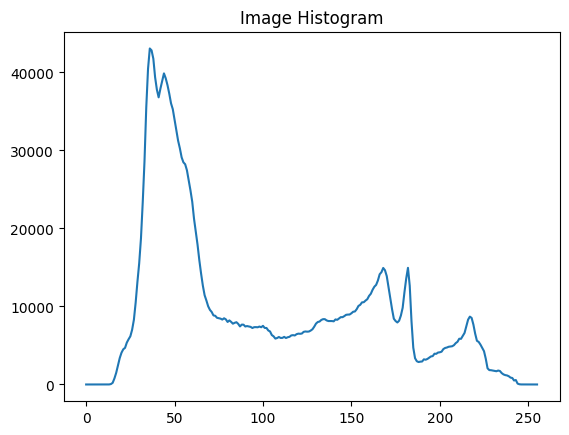

In [33]:
# Calculate histogram
hist = cv2.calcHist([gray], [0], None, [256], [0, 256])

# Plot histogram
plt.plot(hist)
plt.title('Image Histogram')
plt.show()

#### 2.5.2 Image Enhancement and Restoration

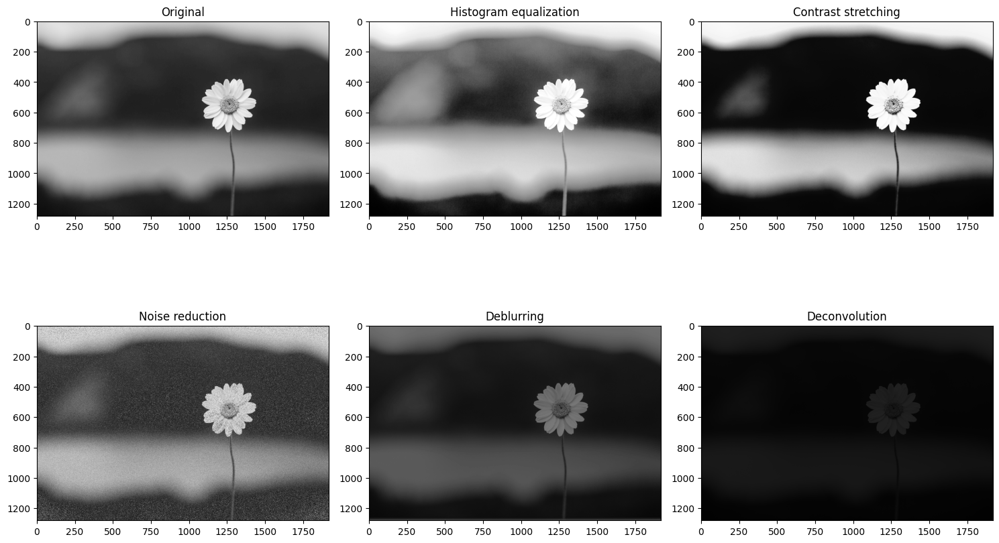

In [34]:
# Histogram equalization
equalized = cv2.equalizeHist(gray)

# Contrast stretching
def contrast_stretch(img):
    xp = [0, 64, 128, 192, 255]
    fp = [0, 16, 128, 240, 255]
    x = np.arange(256)
    table = np.interp(x, xp, fp).astype('uint8')
    return cv2.LUT(img, table)

stretched = contrast_stretch(gray)

# Noise reduction
noisy = gray + np.random.normal(0, 25, gray.shape).astype(np.uint8)
denoised = cv2.fastNlMeansDenoising(noisy, None, 10, 7, 21)

# Deblurring
def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = np.fft.fft2(dummy)
    kernel = np.fft.fft2(kernel, s=img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(np.fft.ifft2(dummy))
    return dummy

kernel = np.ones((5, 5), np.float32) / 25
blurred = cv2.filter2D(gray, -1, kernel)
deblurred = wiener_filter(blurred, kernel, K=0.01)


# Deconvolution
from scipy.signal import convolve2d
def deconvolution(img, psf, iterations):
    img = img.astype(np.float64)
    psf /= psf.sum()
    deconvolved = img.copy()
    for _ in range(iterations):
        deconvolved = deconvolved * convolve2d(img / convolve2d(deconvolved, psf, 'same'), psf[::-1, ::-1], 'same')
    return deconvolved

psf = np.ones((5, 5)) / 25  # Point Spread Function
deconvolved = deconvolution(blurred, psf, iterations=10)

# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(gray, cmap='gray'), plt.title('Original')
plt.subplot(232), plt.imshow(equalized, cmap='gray'), plt.title('Histogram equalization')
plt.subplot(233), plt.imshow(stretched, cmap='gray'), plt.title('Contrast stretching')
plt.subplot(234), plt.imshow(denoised, cmap='gray'), plt.title('Noise reduction')
plt.subplot(235), plt.imshow(deblurred, cmap='gray'), plt.title('Deblurring')
plt.subplot(236), plt.imshow(deconvolved, cmap='gray'), plt.title('Deconvolution')
plt.tight_layout()
plt.show()

## 3. Feature Detection and Description

Feature detection and description are crucial for many computer vision tasks, including object recognition and image matching.

In [35]:
# Load an image
img = cv2.imread('data/PyramidBlack.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

### 3.1 Corner Detection

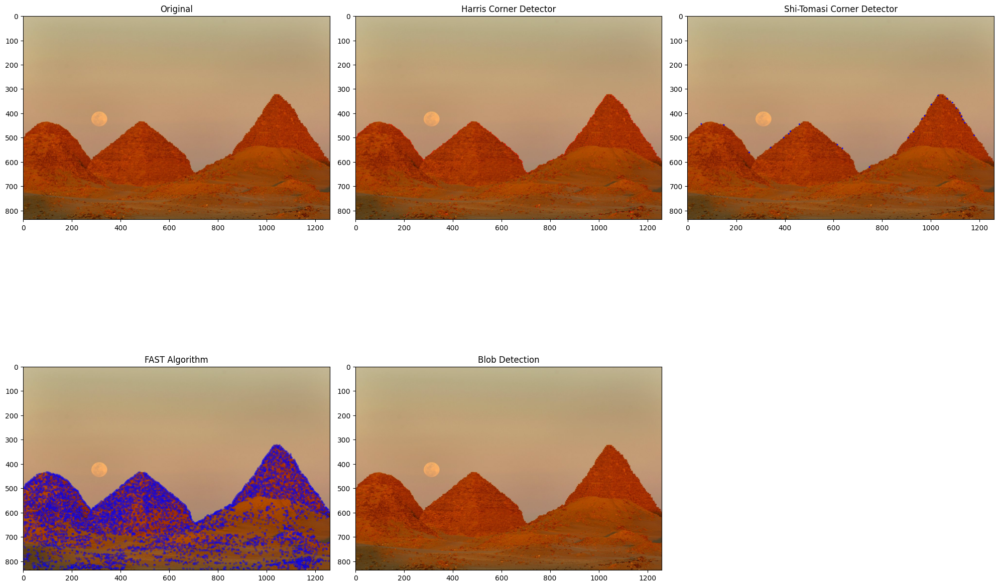

In [36]:
# Harris Corner Detector
dst = cv2.cornerHarris(gray, 2, 3, 0.04)
img_harris = img.copy()
img_harris[dst > 0.01 * dst.max()] = [0, 0, 255]

# Shi-Tomasi Corner Detector
corners = cv2.goodFeaturesToTrack(gray, 25, 0.01, 10)
corners = np.int32(corners)
img_shi_tomasi = img.copy()
for i in corners:
    x, y = i.ravel()
    cv2.circle(img_shi_tomasi, (x, y), 3, 255, -1)

# FAST Algorithm
fast = cv2.FastFeatureDetector_create()
kp = fast.detect(gray, None)
img_fast = cv2.drawKeypoints(img, kp, None, color=(255, 0, 0))

# Setup Simple Blob Detector parameters
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True
params.minArea = 100
detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(gray)
img_blob = cv2.drawKeypoints(img, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display results
plt.figure(figsize=(20, 15))
plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(cv2.cvtColor(img_harris, cv2.COLOR_BGR2RGB)), plt.title('Harris Corner Detector')
plt.subplot(233), plt.imshow(cv2.cvtColor(img_shi_tomasi, cv2.COLOR_BGR2RGB)), plt.title('Shi-Tomasi Corner Detector')
plt.subplot(234), plt.imshow(cv2.cvtColor(img_fast, cv2.COLOR_BGR2RGB)), plt.title('FAST Algorithm')
plt.subplot(235), plt.imshow(cv2.cvtColor(img_blob, cv2.COLOR_BGR2RGB)), plt.title('Blob Detection')
plt.tight_layout()
plt.show()

### 3.2 Feature Descriptors

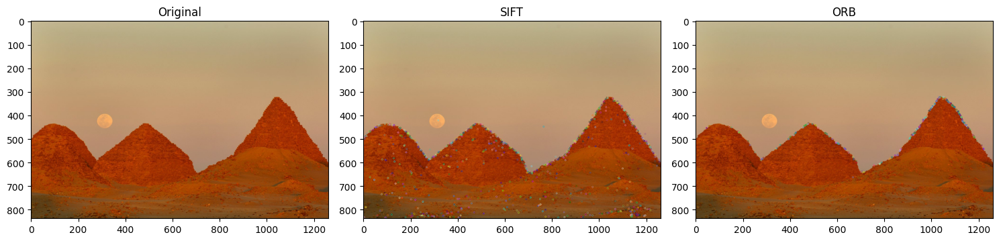

In [37]:
# SIFT (Scale-Invariant Feature Transform)
sift = cv2.SIFT_create()
kp_sift, des_sift = sift.detectAndCompute(gray, None)

# SURF (Speeded Up Robust Features)
# Note: SURF is patented and not available in some OpenCV builds
# surf = cv2.xfeatures2d.SURF_create()
# kp_surf, des_surf = surf.detectAndCompute(gray, None)

# ORB (Oriented FAST and Rotated BRIEF)
orb = cv2.ORB_create()
kp_orb, des_orb = orb.detectAndCompute(gray, None)

# Draw keypoints
img_sift = cv2.drawKeypoints(img, kp_sift, None)
img_orb = cv2.drawKeypoints(img, kp_orb, None)


# Display results
plt.figure(figsize=(15, 10))
plt.subplot(231), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(232), plt.imshow(cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB)), plt.title('SIFT')
plt.subplot(233), plt.imshow(cv2.cvtColor(img_orb, cv2.COLOR_BGR2RGB)), plt.title('ORB')
plt.tight_layout()
plt.show()

### 3.3 Feature Matching Techniques

In [38]:
# Read the images
img1 = cv2.imread('data/GoldenGateBridge-001.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('data/GoldenGateBridge-002.jpg', cv2.IMREAD_GRAYSCALE)

# Initialize the feature detector (e.g., SIFT)
sift = cv2.SIFT_create()

# Find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# 1. Brute-Force Matching
bf = cv2.BFMatcher()
matches_bf = bf.knnMatch(des1, des2, k=2)

# Apply ratio test
good_matches_bf = []
for m, n in matches_bf:
    if m.distance < 0.75 * n.distance:
        good_matches_bf.append(m)

# 2. FLANN-based matching
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(des1, des2, k=2)

# Apply ratio test
good_matches_flann = []
for m, n in matches_flann:
    if m.distance < 0.75 * n.distance:
        good_matches_flann.append(m)

# 3. RANSAC for outlier rejection
# We'll use the good matches from FLANN for this example
src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches_flann]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches_flann]).reshape(-1, 1, 2)

# Find homography
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Select only inlier points
matchesMask = mask.ravel().tolist()

# Draw matches
draw_params_bf = dict(matchColor=(0, 255, 0),
                      singlePointColor=None,
                      flags=cv2.DrawMatchesFlags_DEFAULT)

draw_params_flann = dict(matchColor=(255, 0, 0),
                         singlePointColor=None,
                         flags=cv2.DrawMatchesFlags_DEFAULT)

draw_params_ransac = dict(matchColor=(0, 255, 0),
                          singlePointColor=None,
                          matchesMask=matchesMask,
                          flags=cv2.DrawMatchesFlags_DEFAULT)

img_bf = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_bf, None, **draw_params_bf)
img_flann = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_flann, None, **draw_params_flann)
img_ransac = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_flann, None, **draw_params_ransac)

# Display results
cv2.imshow('Brute-Force Matching', img_bf)
cv2.imshow('FLANN Matching', img_flann)
cv2.imshow('RANSAC (with FLANN matches)', img_ransac)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 4. Image Transformations

Image transformations are essential for tasks like image alignment, panorama stitching, and perspective correction.

### 4.1 Affine Transformations

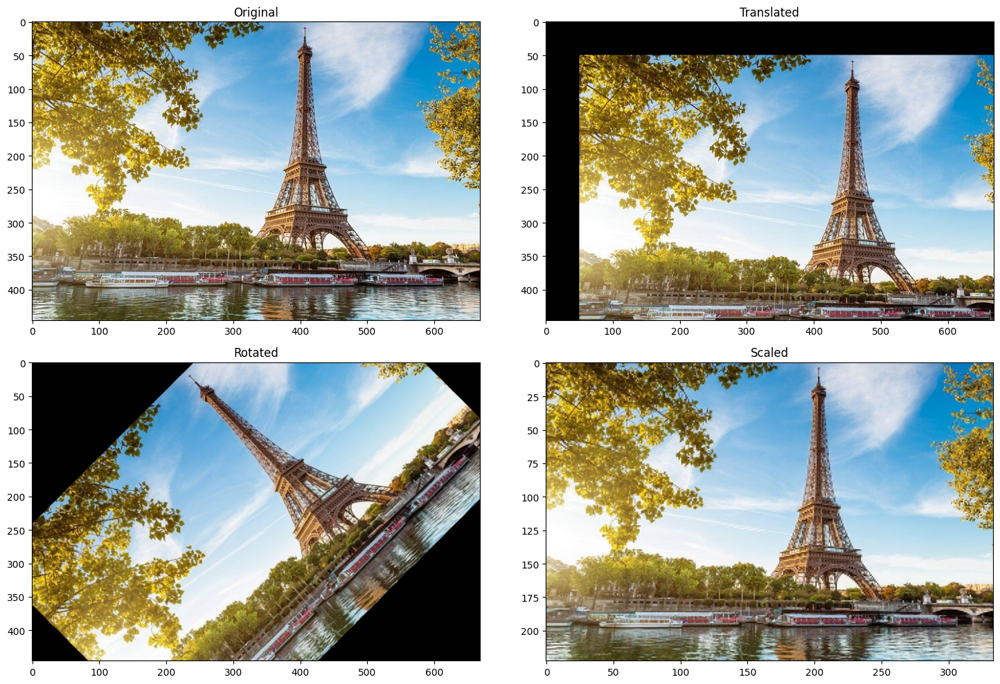

In [39]:
img = cv2.imread('data/Eiffel_Tower.jpg')
rows, cols, ch = img.shape

# Translation
M = np.float32([[1, 0, 50], [0, 1, 50]])
translated = cv2.warpAffine(img, M, (cols, rows))

# Rotation
M = cv2.getRotationMatrix2D((cols/2, rows/2), 45, 1)
rotated = cv2.warpAffine(img, M, (cols, rows))

# Scaling
scaled = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_CUBIC)

plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(222), plt.imshow(cv2.cvtColor(translated, cv2.COLOR_BGR2RGB)), plt.title('Translated')
plt.subplot(223), plt.imshow(cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)), plt.title('Rotated')
plt.subplot(224), plt.imshow(cv2.cvtColor(scaled, cv2.COLOR_BGR2RGB)), plt.title('Scaled')
plt.tight_layout()
plt.show()

### 4.2 Perspective Transformation

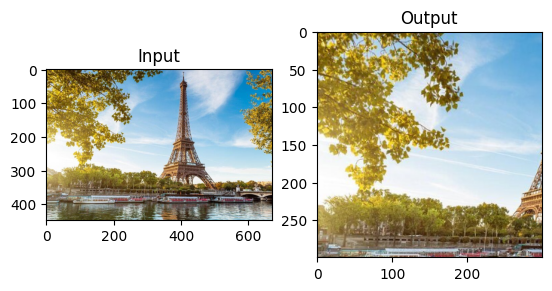

In [40]:
# Define points
pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])

# Get transformation matrix
M = cv2.getPerspectiveTransform(pts1, pts2)

# Apply perspective transformation
dst = cv2.warpPerspective(img, M, (300,300))

plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Input')
plt.subplot(122), plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)), plt.title('Output')
plt.show()

### 4.3 Homography Estimation

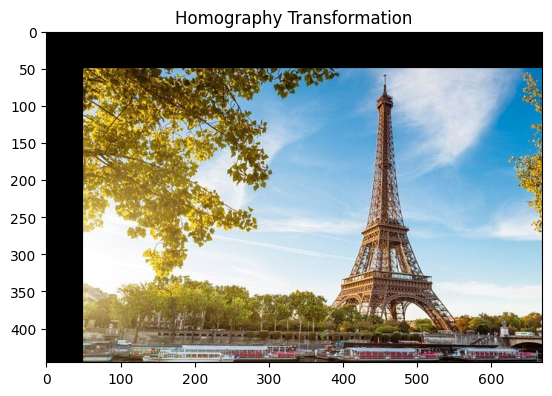

In [41]:
img = cv2.imread('data/Eiffel_Tower.jpg')


# Assume we have two sets of corresponding points
src_pts = np.array([[0, 0], [0, 100], [100, 100], [100, 0]], dtype=np.float32)
dst_pts = np.array([[50, 50], [50, 150], [150, 150], [150, 50]], dtype=np.float32)

# Find homography
H, _ = cv2.findHomography(src_pts, dst_pts)

# Apply homography
result = cv2.warpPerspective(img, H, (cols, rows))

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Homography Transformation')
plt.show()

### 4.4 Image Pyramids

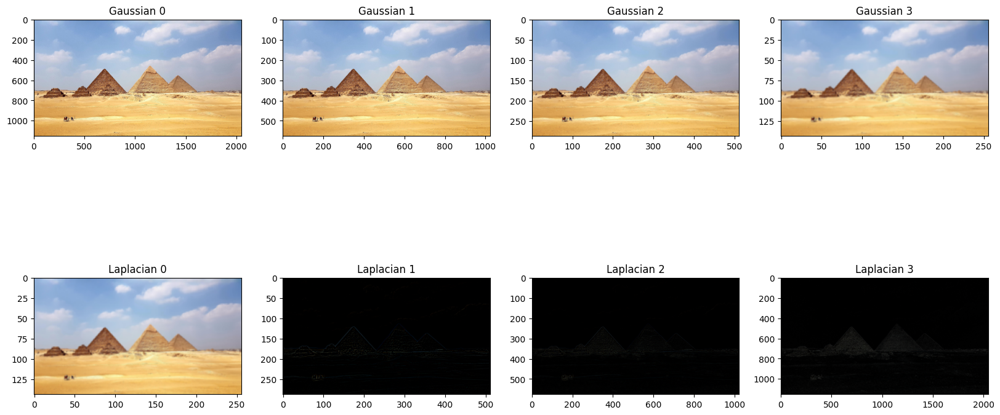

In [42]:
img = cv2.imread('data/great-pyramids.jpg')

# Gaussian Pyramid
lower = img.copy()
gaussian_pyr = [lower]
for i in range(3):
    lower = cv2.pyrDown(lower)
    gaussian_pyr.append(lower)

# Laplacian Pyramid
laplacian_pyr = [gaussian_pyr[-1]]
for i in range(3, 0, -1):
    size = (gaussian_pyr[i - 1].shape[1], gaussian_pyr[i - 1].shape[0])
    gaussian_expanded = cv2.pyrUp(gaussian_pyr[i], dstsize=size)
    laplacian = cv2.subtract(gaussian_pyr[i-1], gaussian_expanded)
    laplacian_pyr.append(laplacian)

# Display pyramids
plt.figure(figsize=(20,10))
plt.subplot(241), plt.imshow(cv2.cvtColor(gaussian_pyr[0], cv2.COLOR_BGR2RGB)), plt.title('Gaussian 0')
plt.subplot(242), plt.imshow(cv2.cvtColor(gaussian_pyr[1], cv2.COLOR_BGR2RGB)), plt.title('Gaussian 1')
plt.subplot(243), plt.imshow(cv2.cvtColor(gaussian_pyr[2], cv2.COLOR_BGR2RGB)), plt.title('Gaussian 2')
plt.subplot(244), plt.imshow(cv2.cvtColor(gaussian_pyr[3], cv2.COLOR_BGR2RGB)), plt.title('Gaussian 3')
plt.subplot(245), plt.imshow(cv2.cvtColor(laplacian_pyr[0], cv2.COLOR_BGR2RGB)), plt.title('Laplacian 0')
plt.subplot(246), plt.imshow(cv2.cvtColor(laplacian_pyr[1], cv2.COLOR_BGR2RGB)), plt.title('Laplacian 1')
plt.subplot(247), plt.imshow(cv2.cvtColor(laplacian_pyr[2], cv2.COLOR_BGR2RGB)), plt.title('Laplacian 2')
plt.subplot(248), plt.imshow(cv2.cvtColor(laplacian_pyr[3], cv2.COLOR_BGR2RGB)), plt.title('Laplacian 3')
plt.show()

## 5. Camera Calibration and 3D Reconstruction

Camera calibration and 3D reconstruction are crucial for understanding the geometric relationship between 2D images and the 3D world.

### 5.1 Camera Calibration

In [43]:
# import numpy as np
# import cv2
# import glob

# # Prepare object points
# objp = np.zeros((6*7,3), np.float32)
# objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

# # Arrays to store object points and image points from all images
# objpoints = [] # 3d points in real world space
# imgpoints = [] # 2d points in image plane

# # Load calibration images
# images = glob.glob('calibration_images/*.jpg')

# gray = None

# for fname in images:
#     img = cv2.imread(fname)
#     gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#     # Find the chess board corners
#     ret, corners = cv2.findChessboardCorners(gray, (7,6), None)

#     # If found, add object points, image points
#     if ret:
#         objpoints.append(objp)
#         imgpoints.append(corners)

# # Check if any corners were found
# if objpoints and imgpoints:
#     # Calibrate camera
#     ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

#     print("Camera matrix:\n", mtx)
#     print("\nDistortion coefficients:\n", dist)
# else:
#     print("No chessboard corners found in any image.")


### 5.2 Stereo Vision

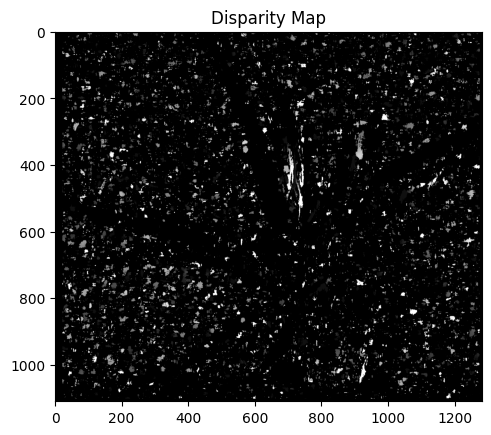

In [44]:
# Load stereo images
imgL = cv2.imread('data/aloeL.jpg', 0)
imgR = cv2.imread('data/aloeR.jpg', 0)

# Create StereoBM object
stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)

# Compute disparity map
disparity = stereo.compute(imgL, imgR)

# Normalize the disparity map for visualization
disparity_normalized = cv2.normalize(disparity, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

plt.imshow(disparity_normalized, 'gray')
plt.title('Disparity Map')
plt.show()

### 5.3 3D Reconstruction Techniques

Structure from Motion (SfM) and Multi-view Stereo (MVS) are complex techniques that typically require additional libraries. Here's a simplified example using OpenCV's triangulation:

In [45]:
# Assume we have camera matrices P1 and P2, and corresponding points points1 and points2
P1 = np.array([[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 1, 0]])
P2 = np.array([[1, 0, 0, -0.1], [0, 1, 0, 0], [0, 0, 1, 0]])

points1 = np.array([[100, 200], [300, 100], [200, 150]])
points2 = np.array([[110, 200], [310, 100], [210, 150]])

# Triangulate points
points_4d = cv2.triangulatePoints(P1, P2, points1.T, points2.T)

# Convert to 3D points
points_3d = points_4d[:3, :] / points_4d[3, :]

print("3D points:\n", points_3d.T)

3D points:
 [[        inf         inf         nan]
 [-3.34385642 -5.19623138 -0.        ]
 [-0.77363722 -0.49784769 -0.        ]]


C:\Users\ssd\AppData\Local\Temp\ipykernel_8108\1502437792.py:12: RuntimeWarning: divide by zero encountered in divide
  points_3d = points_4d[:3, :] / points_4d[3, :]
C:\Users\ssd\AppData\Local\Temp\ipykernel_8108\1502437792.py:12: RuntimeWarning: invalid value encountered in divide
  points_3d = points_4d[:3, :] / points_4d[3, :]


## 6. Object Detection and Tracking

Object detection and tracking are fundamental tasks in computer vision with applications in surveillance, autonomous vehicles, and more.

### 6.1 Haar Cascade for Face Detection

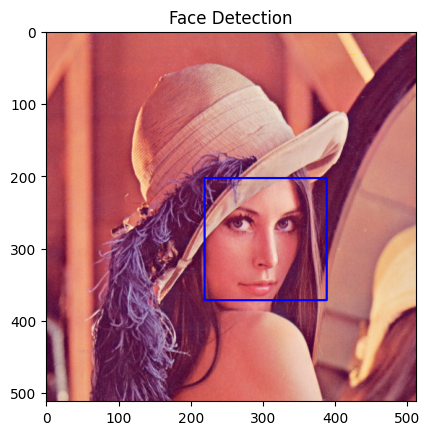

In [46]:
# Load the cascade
face_cascade = cv2.CascadeClassifier('data/haarcascade_frontalface_default.xml')

# Read the input image
img = cv2.imread('data/lena.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, 1.1, 4)

# Draw rectangle around the faces
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

# Display the output
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Face Detection')
plt.show()

### 6.2 HOG for Pedestrian Detection

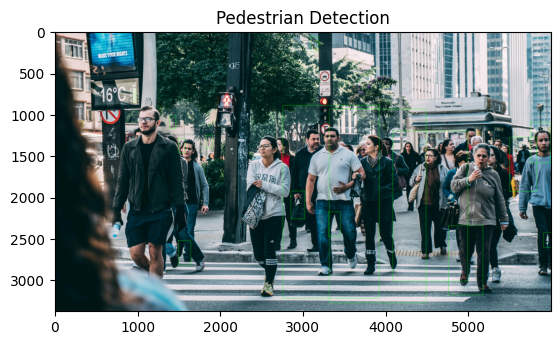

In [47]:
# Initialize HOG descriptor
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Read image
img = cv2.imread('data/pedestrians.jpg')

# Detect pedestrians
boxes, weights = hog.detectMultiScale(img, winStride=(8,8))

# Draw bounding boxes
for (x, y, w, h) in boxes:
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Pedestrian Detection')
plt.show()

### 6.3 Deep Learning-based Object Detection

For deep learning-based methods like YOLO, SSD, and Faster R-CNN, you typically need additional libraries like TensorFlow or PyTorch. Here's a simplified example using OpenCV's DNN module with a pre-trained YOLO model:

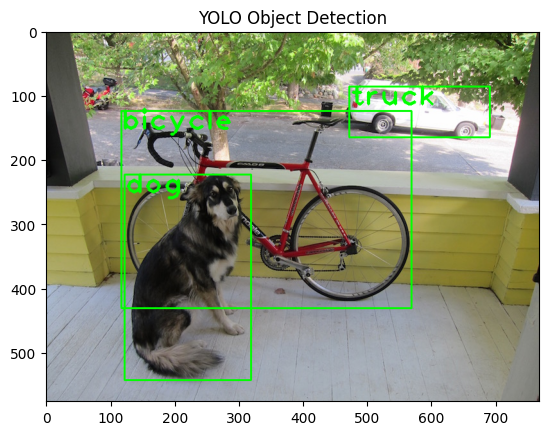

In [48]:
# Load YOLO
net = cv2.dnn.readNet("data/yolov3.weights", "data/yolov3.cfg")
classes = []
with open("data/coco.names", "r") as f:
    classes = [line.strip() for line in f.readlines()]

# Read image
img = cv2.imread('data/dog.jpg')
height, width, _ = img.shape

# Detecting objects
blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(net.getUnconnectedOutLayersNames())

# Showing informations on the screen
class_ids = []
confidences = []
boxes = []
for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]
        if confidence > 0.5:
            # Object detected
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)
            # Rectangle coordinates
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)
            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

for i in range(len(boxes)):
    if i in indexes:
        x, y, w, h = boxes[i]
        label = str(classes[class_ids[i]])
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(img, label, (x, y + 30), cv2.FONT_HERSHEY_PLAIN, 3, (0, 255, 0), 3)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('YOLO Object Detection')
plt.show()

### 6.4 Object Tracking

In [49]:
# Optical Flow tracking
cap = cv2.VideoCapture('data/video.mp4')

# Parameters for Shi-Tomasi corner detection
feature_params = dict(maxCorners = 100, qualityLevel = 0.3, minDistance = 7, blockSize = 7)

# Parameters for Lucas-Kanade optical flow
lk_params = dict(winSize = (15,15), maxLevel = 2, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))

# Create random colors
color = np.random.randint(0, 255, (100, 3))

# Take first frame and find corners in it
ret, old_frame = cap.read()
old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, **feature_params)

# Create a mask image for drawing purposes
mask = np.zeros_like(old_frame)

while(1):
    ret, frame = cap.read()
    if not ret:
        break
    
    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, **lk_params)

    # Select good points
    good_new = p1[st==1]
    good_old = p0[st==1]

    # Draw the tracks
    for i,(new,old) in enumerate(zip(good_new, good_old)):
        a,b = new.ravel()
        c,d = old.ravel()
        mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), color[i].tolist(), 2)
        frame = cv2.circle(frame, (int(a),int(b)), 5, color[i].tolist(), -1)
        img = cv2.add(frame, mask)

    cv2.imshow('frame', img)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

    # Update the previous frame and previous points
    old_gray = frame_gray.copy()
    p0 = good_new.reshape(-1, 1, 2)

cv2.destroyAllWindows()
cap.release()

This notebook covers the basics of camera calibration, 3D reconstruction, object detection, and tracking using OpenCV. Here's a brief overview of the modern tracking algorithms mentioned:

1. KCF (Kernelized Correlation Filters): Fast and accurate for various scenarios.
2. CSRT (Discriminative Correlation Filter with Channel and Spatial Reliability): More accurate but slower than KCF.
3. MedianFlow: Good for predictable and slow-moving objects.

Each tracker has its strengths and weaknesses, and the choice depends on the specific application and requirements for speed vs. accuracy.

## 7. Video Analysis

Video analysis is a crucial aspect of computer vision, allowing us to process and extract information from sequences of images.

### 7.1 Reading and Writing Video Streams

In [50]:
# # Reading video
# cap = cv2.VideoCapture('input_video.mp4')

# # Define the codec and create VideoWriter object
# fourcc = cv2.VideoWriter_fourcc(*'XVID')
# out = cv2.VideoWriter('output.avi', fourcc, 20.0, (640, 480))

# while cap.isOpened():
#     ret, frame = cap.read()
#     if ret:
#         # Write the frame
#         out.write(frame)
        
#         # Display the resulting frame
#         cv2.imshow('Frame', frame)
#         if cv2.waitKey(1) & 0xFF == ord('q'):
#             break
#     else:
#         break

# # Release everything when done
# cap.release()
# out.release()
# cv2.destroyAllWindows()

### 7.2 Background Subtraction Techniques

In [51]:
# # Frame differencing
# cap = cv2.VideoCapture('input_video.mp4')
# ret, frame1 = cap.read()
# prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)

# while True:
#     ret, frame2 = cap.read()
#     if not ret:
#         break
#     curr = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
#     # Simple frame differencing
#     diff = cv2.absdiff(curr, prvs)
    
#     cv2.imshow('Frame Difference', diff)
#     prvs = curr
    
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break

# cap.release()
# cv2.destroyAllWindows()

# # MOG2 algorithm
# cap = cv2.VideoCapture('input_video.mp4')
# fgbg = cv2.createBackgroundSubtractorMOG2()

# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break
    
#     fgmask = fgbg.apply(frame)
    
#     cv2.imshow('MOG2', fgmask)
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break

# cap.release()
# cv2.destroyAllWindows()

### 7.3 Motion Detection and Analysis

In [52]:
# cap = cv2.VideoCapture('input_video.mp4')
# ret, frame1 = cap.read()
# prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
# hsv = np.zeros_like(frame1)
# hsv[..., 1] = 255

# while True:
#     ret, frame2 = cap.read()
#     if not ret:
#         break
#     next = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
#     # Calculate optical flow
#     flow = cv2.calcOpticalFlowFarneback(prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
#     # Compute magnitude and angle of 2D vector
#     mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
    
#     # Set image hue according to the optical flow direction
#     hsv[..., 0] = ang * 180 / np.pi / 2
    
#     # Set image value according to the optical flow magnitude (normalized)
#     hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
    
#     # Convert HSV to BGR for display
#     rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    
#     cv2.imshow('Motion Detection', rgb)
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break
    
#     prvs = next

# cap.release()
# cv2.destroyAllWindows()

### 7.4 Optical Flow

In [53]:
# # Dense optical flow
# cap = cv2.VideoCapture('input_video.mp4')
# ret, frame1 = cap.read()
# prvs = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
# hsv = np.zeros_like(frame1)
# hsv[..., 1] = 255

# while True:
#     ret, frame2 = cap.read()
#     if not ret:
#         break
#     next = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
#     flow = cv2.calcOpticalFlowFarneback(prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    
#     mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
#     hsv[..., 0] = ang * 180 / np.pi / 2
#     hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)
#     rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    
#     cv2.imshow('Dense Optical Flow', rgb)
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break
    
#     prvs = next

# cap.release()
# cv2.destroyAllWindows()

# # Sparse optical flow (Lucas-Kanade method)
# cap = cv2.VideoCapture('input_video.mp4')
# ret, old_frame = cap.read()
# old_gray = cv2.cvtColor(old_frame, cv2.COLOR_BGR2GRAY)
# p0 = cv2.goodFeaturesToTrack(old_gray, mask = None, maxCorners = 100, qualityLevel = 0.3, minDistance = 7, blockSize = 7)

# # Create a mask image for drawing purposes
# mask = np.zeros_like(old_frame)

# while True:
#     ret, frame = cap.read()
#     if not ret:
#         break
#     frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
#     # Calculate optical flow
#     p1, st, err = cv2.calcOpticalFlowPyrLK(old_gray, frame_gray, p0, None, winSize = (15,15), maxLevel = 2, criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03))
    
#     # Select good points
#     good_new = p1[st==1]
#     good_old = p0[st==1]
    
#     # Draw the tracks
#     for i,(new,old) in enumerate(zip(good_new, good_old)):
#         a,b = new.ravel()
#         c,d = old.ravel()
#         mask = cv2.line(mask, (int(a),int(b)), (int(c),int(d)), (0,255,0), 2)
#         frame = cv2.circle(frame, (int(a),int(b)), 5, (0,0,255), -1)
#     img = cv2.add(frame, mask)
    
#     cv2.imshow('Sparse Optical Flow', img)
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break
    
#     old_gray = frame_gray.copy()
#     p0 = good_new.reshape(-1, 1, 2)

# cap.release()
# cv2.destroyAllWindows()

## 8. OpenCV Optimization and GPU Acceleration

OpenCV offers various optimization techniques and GPU acceleration capabilities to enhance performance.

### 8.1 Using OpenCV's UMat for Transparent GPU Acceleration

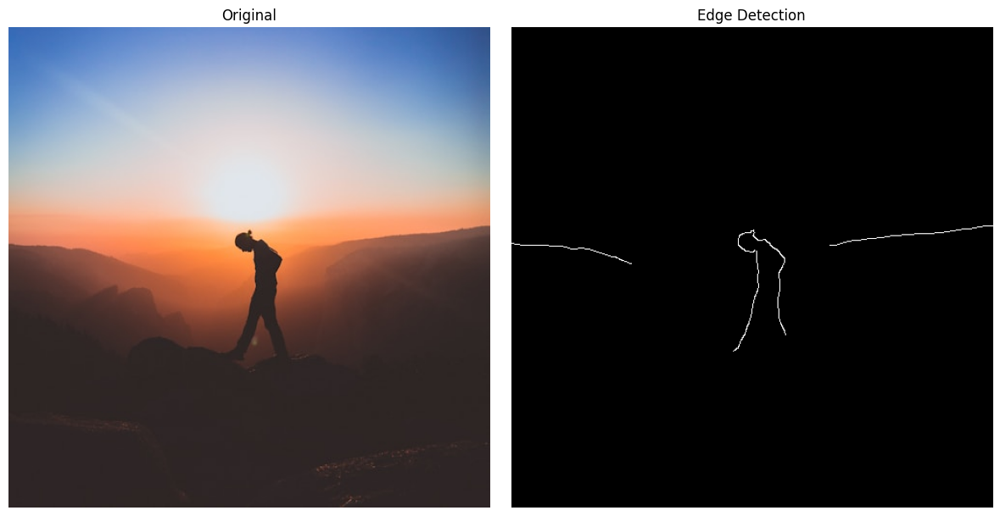

In [54]:
# Using UMat
img = cv2.imread('data/man.jfif')
umat_img = cv2.UMat(img)

# Perform operations on UMat
blurred = cv2.GaussianBlur(umat_img, (5, 5), 0)
edges = cv2.Canny(blurred, 100, 200)

# Convert back to CPU if needed
result = edges.get()


# Convert color space from BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
ax1.imshow(img_rgb)
ax1.set_title('Original')
ax1.axis('off')

# Display edge detection result
ax2.imshow(result, cmap='gray')
ax2.set_title('Edge Detection')
ax2.axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### 8.2 Using OpenCV's GPU Modules

In [55]:
# Load image
img = cv2.imread('data/lightbulb.webp')

# Check CUDA availability
if cv2.cuda.getCudaEnabledDeviceCount() == 0:
    print("No CUDA-capable device detected")

    # Perform CPU operations
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (7, 7), 0)
    
    # Display result
    cv2.imshow('CPU Processed Image', blur)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
else:
    print(f"CUDA-capable device detected: {cv2.cuda.getDevice()}")
    
    gpu_img = cv2.cuda_GpuMat()
    gpu_img.upload(img)
    
    # Perform GPU operations
    gpu_gray = cv2.cuda.cvtColor(gpu_img, cv2.COLOR_BGR2GRAY)
    gpu_blur = cv2.cuda.GaussianBlur(gpu_gray, (7, 7), 0)
    
    # Download result back to CPU
    result = gpu_blur.download()
    
    cv2.imshow('GPU Processed Image', result)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

No CUDA-capable device detected


### 8.3 Optimizing Code for Performance

#### 8.3.1 Vectorization Techniques
Vectorization is a technique that allows us to perform operations on entire arrays or matrices at once, rather than using loops. This can significantly improve performance, especially for large datasets.

In [56]:
import time

# Load an example image
image = cv2.imread('data/transparency_demonstration.png')

# Non-vectorized approach (slow)
def slow_brightness_adjustment(image, factor):
    result = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            for k in range(image.shape[2]):
                result[i, j, k] = np.clip(image[i, j, k] * factor, 0, 255)
    return result

# Vectorized approach (fast)
def fast_brightness_adjustment(image, factor):
    return np.clip(image * factor, 0, 255).astype(np.uint8)

# Compare performance
factor = 1.5

start_time = time.time()
slow_result = slow_brightness_adjustment(image, factor)
slow_time = time.time() - start_time

start_time = time.time()
fast_result = fast_brightness_adjustment(image, factor)
fast_time = time.time() - start_time

print(f"Slow method time: {slow_time:.4f} seconds")
print(f"Fast method time: {fast_time:.4f} seconds")
print(f"Speedup: {slow_time / fast_time:.2f}x")

Slow method time: 20.5704 seconds
Fast method time: 0.0120 seconds
Speedup: 1714.60x


#### 8.3.2 Parallel Processing with OpenCV

In [57]:
# import cv2
# import numpy as np
# import time
# from multiprocessing import Pool, cpu_count

# # Load an example image
# image = cv2.imread('data/Vd-Orig.png')

# # image = cv2.resize(image, (640, 480))  # Resize to a smaller size
# # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

# # Define a computationally intensive task
# def apply_complex_filter(src, dst, kernel_size):
#     cv2.GaussianBlur(src, (kernel_size, kernel_size), 0, dst)
#     cv2.Laplacian(dst, cv2.CV_8U, dst)
#     cv2.threshold(dst, 100, 255, cv2.THRESH_BINARY, dst)

# # Sequential processing
# def process_sequentially(image, kernel_size):
#     result = np.zeros_like(image)
#     apply_complex_filter(image, result, kernel_size)
#     return result

# # Function to process a chunk of the image
# def process_chunk(args):
#     chunk, kernel_size = args
#     result = np.zeros_like(chunk)
#     apply_complex_filter(chunk, result, kernel_size)
#     return result

# # Parallel processing
# def process_in_parallel(image, kernel_size):
#     # Determine the number of CPU cores to use
#     num_cores = cpu_count()
    
#     # Split the image into chunks
#     chunks = np.array_split(image, num_cores)
    
#     # Prepare arguments for multiprocessing
#     args = [(chunk, kernel_size) for chunk in chunks]
    
#     # Process chunks in parallel
#     with Pool(num_cores) as pool:
#         results = pool.map(process_chunk, args)
    
#     # Combine the results
#     return np.vstack(results)

# # Compare performance
# kernel_size = 15

# start_time = time.time()
# sequential_result = process_sequentially(image, kernel_size)
# sequential_time = time.time() - start_time

# start_time = time.time()
# parallel_result = process_in_parallel(image, kernel_size)
# parallel_time = time.time() - start_time

# print(f"Sequential processing time: {sequential_time:.4f} seconds")
# print(f"Parallel processing time: {parallel_time:.4f} seconds")
# print(f"Speedup: {sequential_time / parallel_time:.2f}x")

# # Optionally, you can save or display the results
# cv2.imwrite('sequential_result.png', sequential_result)
# cv2.imwrite('parallel_result.png', parallel_result)

# # To display the results (uncomment if you're running this in an environment with GUI)
# cv2.imshow('Sequential Result', sequential_result)
# cv2.imshow('Parallel Result', parallel_result)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

## 9. Machine Learning Integration

OpenCV can be integrated with various machine learning algorithms and deep learning frameworks for advanced computer vision tasks.

### 9.1  Traditional ML (SVM)

In [58]:
# import os
# import cv2
# import numpy as np
# from skimage.feature import hog
# from sklearn.model_selection import train_test_split
# from sklearn.svm import SVC
# from sklearn.metrics import accuracy_score, classification_report

# # Load and preprocess image data
# def load_image_data(directory):
#     images = []
#     labels = []
#     for filename in os.listdir(directory):
#         if filename.endswith(".jpg"):
#             # Load the image
#             img_path = os.path.join(directory, filename)
#             img = cv2.imread(img_path)
            
#             # Check if image is loaded properly
#             if img is None:
#                 print(f"Error loading image: {filename}")
#                 continue
            
#             # Resize image
#             img = cv2.resize(img, (128, 128))  # Example size, adjust as needed
            
#             # Convert BGR to RGB (OpenCV loads images in BGR format)
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
#             # Add image to list
#             images.append(img)
            
#             # Extract label from filename
#             label = filename.split('_')[0]  # Assumes breed name is before first underscore
#             labels.append(label)
    
#     # Convert lists to numpy arrays
#     return np.array(images), np.array(labels)

# # Extract HOG features
# def extract_hog_features(images):
#     hog_features = []
#     for img in images:
#         # Convert image to grayscale
#         gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
#         # Extract HOG features
#         features, _ = hog(gray, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys', visualize=True)
        
#         hog_features.append(features)
    
#     return np.array(hog_features)

# # Load data
# X, y = load_image_data('data/images')

# # Extract features
# X_features = extract_hog_features(X)

# # Split data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X_features, y, test_size=0.2, random_state=42)

# # Train classifier
# clf = SVC(kernel='linear')
# clf.fit(X_train, y_train)

# # Make predictions
# y_pred = clf.predict(X_test)

# # Evaluate model
# print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
# # print(classification_report(y_test, y_pred))



### 9.2 Deep Learning Frameworks Integration

#### 9.2.1 TensorFlow and Keras

In [59]:
# import os
# import numpy as np
# import cv2
# from sklearn.preprocessing import LabelEncoder
# from sklearn.model_selection import train_test_split
# from tensorflow import keras

# # Load and preprocess image data
# def load_image_data(directory):
#     images = []
#     labels = []
#     for filename in os.listdir(directory):
#         if filename.endswith(".jpg"):
#             # Load the image
#             img_path = os.path.join(directory, filename)
#             img = cv2.imread(img_path)
            
#             # Check if image is loaded properly
#             if img is None:
#                 print(f"Error loading image: {filename}")
#                 continue
            
#             # Resize image if needed
#             # img = cv2.resize(img, (128, 128))  # Example size, adjust as needed
#             img = cv2.resize(img, (224, 224))  # Example size, adjust as needed
            
#             # Convert BGR to RGB (OpenCV loads images in BGR format)
#             img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
#             # Add image to list
#             images.append(img)
            
#             # Extract label from filename
#             label = filename.split('_')[0]  # Assumes breed name is before first underscore
#             labels.append(label)
    
#     # Convert lists to numpy arrays
#     return np.array(images), np.array(labels)

# # Usage
# X, y = load_image_data('data/images')

# # Assuming X and y are already loaded as per the previous function

# # 1. Preprocess the data
# # Encode labels
# le = LabelEncoder()
# y_encoded = le.fit_transform(y)

# # Normalize pixel values
# X = X.astype('float32') / 255.0

# # Split the data
# X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# # 2. Data Augmentation
# data_augmentation = keras.Sequential([
#     keras.layers.RandomFlip("horizontal"),
#     keras.layers.RandomRotation(0.1),
#     keras.layers.RandomZoom(0.1),
# ])

# # 3. Create the model
# base_model = keras.applications.ResNet50V2(
#     weights='imagenet',
#     include_top=False,
#     input_shape=(224, 224, 3)
# )

# # Freeze the base model
# base_model.trainable = False

# model = keras.Sequential([
#     data_augmentation,
#     base_model,
#     keras.layers.GlobalAveragePooling2D(),
#     keras.layers.Dropout(0.5),
#     keras.layers.Dense(256, activation='relu'),
#     keras.layers.Dropout(0.3),
#     keras.layers.Dense(len(le.classes_), activation='softmax')
# ])

# # 4. Compile the model
# model.compile(
#     optimizer=keras.optimizers.Adam(learning_rate=0.0001),
#     loss='sparse_categorical_crossentropy',
#     metrics=['accuracy']
# )

# # 5. Train the model
# history = model.fit(
#     X_train, y_train,
#     epochs=20,
#     batch_size=32,
#     validation_split=0.2,
#     callbacks=[
#         keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
#         keras.callbacks.ReduceLROnPlateau(factor=0.2, patience=3)
#     ]
# )

# # 6. Evaluate the model
# test_loss, test_accuracy = model.evaluate(X_test, y_test)
# print(f"Test accuracy: {test_accuracy:.4f}")

# # 7. Fine-tuning (optional)
# base_model.trainable = True
# for layer in base_model.layers[:100]:
#     layer.trainable = False

# model.compile(
#     optimizer=keras.optimizers.Adam(learning_rate=1e-5),
#     loss='sparse_categorical_crossentropy',
#     metrics=['accuracy']
# )

# history_fine = model.fit(
#     X_train, y_train,
#     epochs=10,
#     batch_size=32,
#     validation_split=0.2,
#     callbacks=[
#         keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True),
#         keras.callbacks.ReduceLROnPlateau(factor=0.2, patience=2)
#     ]
# )

# # Final evaluation
# test_loss, test_accuracy = model.evaluate(X_test, y_test)
# print(f"Final test accuracy: {test_accuracy:.4f}")

#### 9.2.2 PyTorch

In [60]:
# import os
# import random
# import logging
# from tqdm import tqdm
# from PIL import Image
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torchvision import models, transforms
# from torch.utils.data import DataLoader, Dataset
# from sklearn.model_selection import train_test_split
# from torchvision.models import ResNet50_Weights

# # Set up logging
# logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# # Set device
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# class DogBreedDataset(Dataset):
#     def __init__(self, root_dir, file_list, classes, transform=None):
#         self.root_dir = root_dir
#         self.file_list = file_list
#         self.transform = transform
#         self.classes = classes
#         self.class_to_idx = {cls: i for i, cls in enumerate(classes)}

#     def __len__(self):
#         return len(self.file_list)

#     def __getitem__(self, idx):
#         try:
#             img_name, label = self.file_list[idx]
#             img_path = os.path.join(self.root_dir, img_name)
#             image = Image.open(img_path).convert('RGB')
            
#             if self.transform:
#                 image = self.transform(image)
            
#             return image, label
#         except Exception as e:
#             logging.error(f"Error loading image {img_name}: {str(e)}")
#             return torch.zeros((3, 224, 224)), 0

# def split_dataset(root_dir, val_split=0.2):
#     all_images = []
#     for img_name in tqdm(os.listdir(root_dir), desc="Processing images"):
#         if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
#             class_name = img_name.split('_')[0]
#             all_images.append((img_name, class_name))
    
#     classes = sorted(list(set(class_name for _, class_name in all_images)))
#     class_to_idx = {cls: i for i, cls in enumerate(classes)}
    
#     all_images = [(img, class_to_idx[cls]) for img, cls in all_images]
    
#     train_files, val_files = train_test_split(all_images, test_size=val_split, stratify=[x[1] for x in all_images], random_state=42)
    
#     return train_files, val_files, classes

# class DogBreedCNN(nn.Module):
#     def __init__(self, num_classes):
#         super(DogBreedCNN, self).__init__()
#         self.features = nn.Sequential(
#             nn.Conv2d(3, 64, kernel_size=3, padding=1),
#             nn.ReLU(inplace=True),
#             nn.MaxPool2d(kernel_size=2, stride=2),
#             nn.Conv2d(64, 128, kernel_size=3, padding=1),
#             nn.ReLU(inplace=True),
#             nn.MaxPool2d(kernel_size=2, stride=2),
#             nn.Conv2d(128, 256, kernel_size=3, padding=1),
#             nn.ReLU(inplace=True),
#             nn.MaxPool2d(kernel_size=2, stride=2),
#         )
#         self.classifier = nn.Sequential(
#             nn.Dropout(),
#             nn.Linear(256 * 28 * 28, 1024),
#             nn.ReLU(inplace=True),
#             nn.Dropout(),
#             nn.Linear(1024, num_classes)
#         )

#     def forward(self, x):
#         x = self.features(x)
#         x = torch.flatten(x, 1)
#         x = self.classifier(x)
#         return x

# def get_pretrained_model(num_classes):
#     model = models.resnet50(weights=ResNet50_Weights.IMAGENET1K_V1) #DEFAULT to get the most up-to-date weights.
#     for param in model.parameters():
#         param.requires_grad = False
#     num_ftrs = model.fc.in_features
#     model.fc = nn.Linear(num_ftrs, num_classes)
#     return model

# def train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=10):
#     for epoch in range(num_epochs):
#         logging.info(f'Epoch {epoch+1}/{num_epochs}')
#         logging.info('-' * 10)

#         for phase in ['train', 'val']:
#             if phase == 'train':
#                 model.train()
#                 dataloader = train_loader
#             else:
#                 model.eval()
#                 dataloader = val_loader

#             running_loss = 0.0
#             running_corrects = 0

#             pbar = tqdm(dataloader, desc=f'{phase.capitalize()} Epoch {epoch+1}/{num_epochs}')
            
#             for inputs, labels in pbar:
#                 try:
#                     inputs = inputs.to(device)
#                     labels = labels.to(device)

#                     optimizer.zero_grad()

#                     with torch.set_grad_enabled(phase == 'train'):
#                         outputs = model(inputs)
#                         _, preds = torch.max(outputs, 1)
#                         loss = criterion(outputs, labels)

#                         if phase == 'train':
#                             loss.backward()
#                             optimizer.step()

#                     running_loss += loss.item() * inputs.size(0)
#                     running_corrects += torch.sum(preds == labels.data)

#                     pbar.set_postfix({'loss': loss.item()})
#                 except Exception as e:
#                     logging.error(f"Error in batch: {str(e)}")
#                     continue

#             epoch_loss = running_loss / len(dataloader.dataset)
#             epoch_acc = running_corrects.double() / len(dataloader.dataset)

#             logging.info(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

#         scheduler.step()

#     return model

# def main():
#     # Set random seed for reproducibility
#     torch.manual_seed(42)
#     random.seed(42)

#     # Define transforms
#     train_transform = transforms.Compose([
#         transforms.RandomResizedCrop(224),
#         transforms.RandomHorizontalFlip(),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ])

#     val_transform = transforms.Compose([
#         transforms.Resize(256),
#         transforms.CenterCrop(224),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ])

#     # Prepare datasets
#     root_dir = 'data/images'
#     train_files, val_files, classes = split_dataset(root_dir)

#     logging.info(f"Number of training files: {len(train_files)}")
#     logging.info(f"Number of validation files: {len(val_files)}")
#     logging.info(f"Number of classes: {len(classes)}")

#     if len(train_files) == 0 or len(val_files) == 0:
#         raise ValueError("Dataset is empty. Please check your data directory.")

#     # Create datasets and dataloaders
#     train_dataset = DogBreedDataset(root_dir, train_files, classes, transform=train_transform)
#     val_dataset = DogBreedDataset(root_dir, val_files, classes, transform=val_transform)

#     train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)
#     val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=0)

#     logging.info(f"Number of training samples: {len(train_dataset)}")
#     logging.info(f"Number of validation samples: {len(val_dataset)}")

#     num_classes = len(classes)

#     # Train Custom CNN
#     logging.info("Training Custom CNN:")
#     model_cnn = DogBreedCNN(num_classes).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model_cnn.parameters(), lr=0.001)
#     scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

#     model_cnn = train_model(model_cnn, criterion, optimizer, scheduler, train_loader, val_loader)

#     # Save the model
#     torch.save(model_cnn.state_dict(), 'dog_breed_cnn.pth')

#     # Train Pretrained Model
#     logging.info("Training Pretrained Model:")
#     model_pretrained = get_pretrained_model(num_classes).to(device)
#     criterion = nn.CrossEntropyLoss()
#     optimizer = optim.Adam(model_pretrained.fc.parameters(), lr=0.001)
#     scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

#     model_pretrained = train_model(model_pretrained, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=2)

#     # Save the model
#     torch.save(model_pretrained.state_dict(), 'dog_breed_pretrained.pth')

# if __name__ == '__main__':
#     main()

### 9.3 Using Pre-trained Models with OpenCV's DNN Module

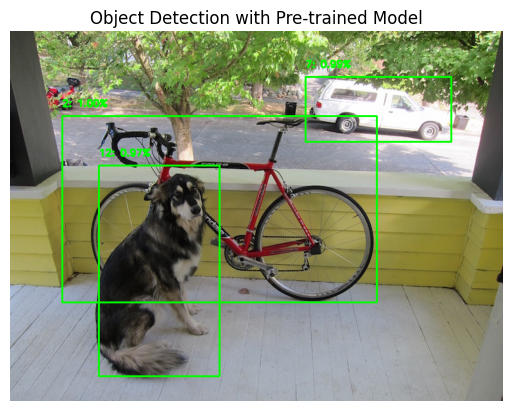

In [61]:
# Load a pre-trained model (e.g., MobileNet SSD)
net = cv2.dnn.readNetFromCaffe('data/MobileNetSSD_deploy.prototxt', 'data/MobileNetSSD_deploy.caffemodel')

# Load an image
image = cv2.imread('data/dog.jpg')
height, width = image.shape[:2]

# Prepare the image for input to the neural network
blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 0.007843, (300, 300), 127.5)

# Pass the blob through the network and obtain the detections and predictions
net.setInput(blob)
detections = net.forward()

# Loop over the detections
for i in range(detections.shape[2]):
    confidence = detections[0, 0, i, 2]
    if confidence > 0.2:
        class_id = int(detections[0, 0, i, 1])
        box = detections[0, 0, i, 3:7] * np.array([width, height, width, height])
        (startX, startY, endX, endY) = box.astype("int")
        
        # Draw the prediction on the frame
        label = f"{class_id}: {confidence:.2f}%"
        cv2.rectangle(image, (startX, startY), (endX, endY), (0, 255, 0), 2)
        y = startY - 15 if startY - 15 > 15 else startY + 15
        cv2.putText(image, label, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Display the output image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Object Detection with Pre-trained Model')
plt.axis('off')
plt.show()

This section demonstrates the integration of various machine learning techniques with OpenCV:

1. Traditional ML algorithms (SVM) using scikit-learn
2. Deep learning with TensorFlow/Keras and PyTorch
3. Using pre-trained models with OpenCV's DNN module

These examples provide a starting point for incorporating machine learning into computer vision projects. Depending on the specific task and dataset, you may need to adjust the model architectures, hyperparameters, and preprocessing steps.

In [1]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
